In [1]:
# Libraries that this notebook will use:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from datascience import *
from matplotlib.colors import ListedColormap
import re
# Helps the maps display nicely in the notebook:
%matplotlib inline
plt.rcParams['figure.figsize'] = [30, 20]
# Tells the notebook not to display warnings:
import warnings
warnings.filterwarnings('ignore')
from IPython.display import IFrame

# HOLC areas
**We have data for these areas in California: Fresno, Los Angeles, San Francisco, San Jose, Stockton, San Diego, Oakland.**

In [2]:
from matplotlib.colors import ListedColormap

# Create a ListedColormap object called holc_cmap, pass in the list of colors
holc_cmap = ListedColormap(['green', 'blue', 'yellow', 'red'], name='holc_colors')

# San Francisco

In [ ]:
import sys
sys.gettrace

In [13]:
sf = gpd.read_file('../espm-c167/Lab2-Draft/holc_oakland')
census2000 = gpd.read_file("census2000")

DriverError: ../espm-c167/Lab2-Draft/holc_oakland: No such file or directory

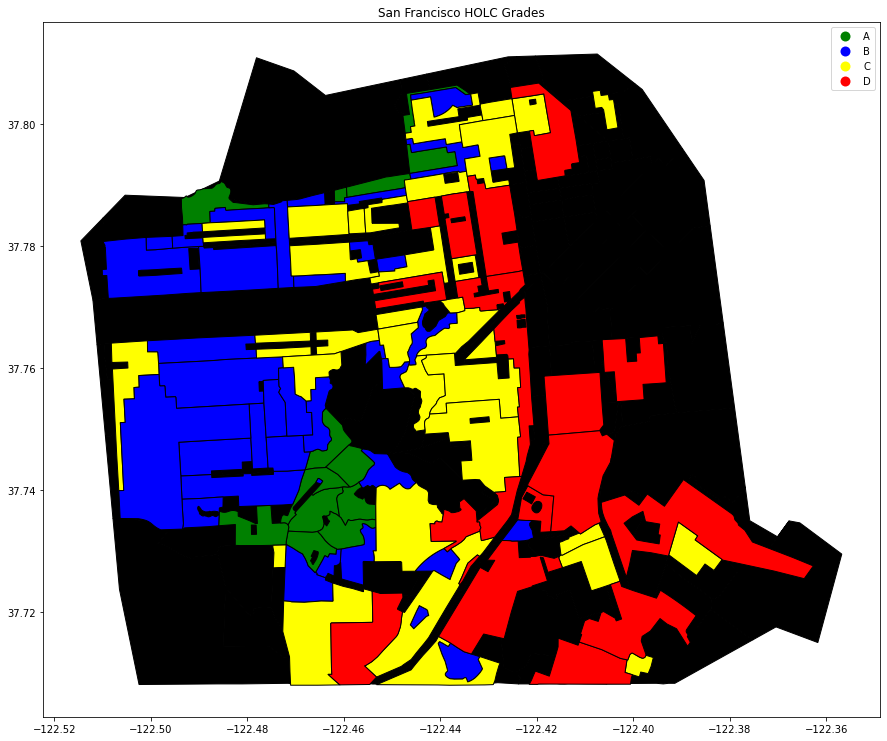

In [12]:
sf_county_1 = census2000[census2000['COUNTY']=='075']

geometries_str = sf_county_1['geometry'].apply(lambda x: x.wkt).values
sf_county_2 = sf_county_1[['-123' not in i for i in geometries_str]]

geometries_str_2 = sf_county_2['geometry'].apply(lambda x: x.wkt).values
sf_county_3 = sf_county_2[['37.82' not in i for i in geometries_str_2]]
base = sf_county_3.plot(figsize=(15, 15), color='black')

sf = gpd.read_file('holc_sf')
sf.plot(ax =base, column = 'holc_grade', cmap = holc_cmap, legend = True, figsize=[18, 10])
plt.title('San Francisco HOLC Grades');
# plt.axis('off');

In [6]:
# ! pip install osmnx

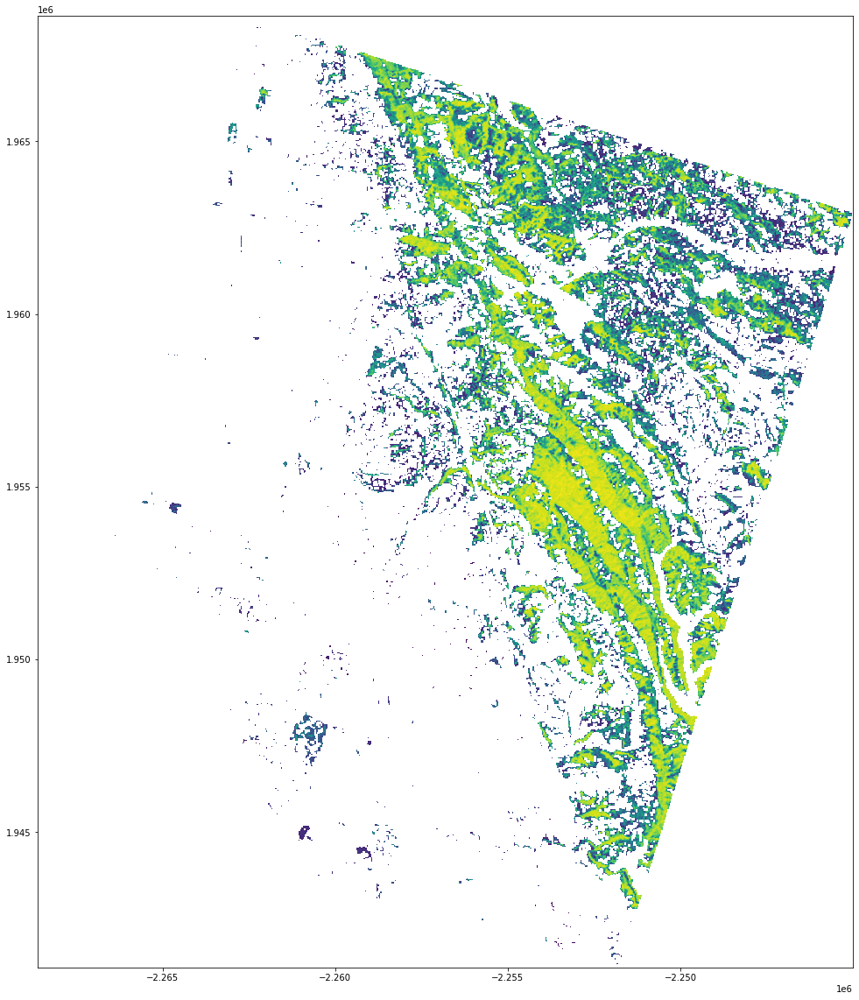

<AxesSubplot:>

In [6]:
import rasterio
from rasterio.plot import show
from rasterstats import zonal_stats
import osmnx as ox
import os

# File path
data_dir = "CA_trees2016"
dem_fp = os.path.join(data_dir, "2016_tree_canopy_OAK.tif")

# Read the Digital Elevation Model for Helsinki
dem = rasterio.open(dem_fp)
show(dem)


# **https://rasterio.readthedocs.io/en/latest/topics/plotting.html**

# Keywords for Kallio and Helsinki in such format that they can be found from OSM
sf_query = "Kallio, Helsinki, Finland"

# Retrieve the geometries of those areas using osmnx
sf_place = ox.gdf_from_place(kallio_q)

# Reproject to same coordinate system as the
sf_place = sf_place.to_crs(crs=dem.crs)

type(sf_place)

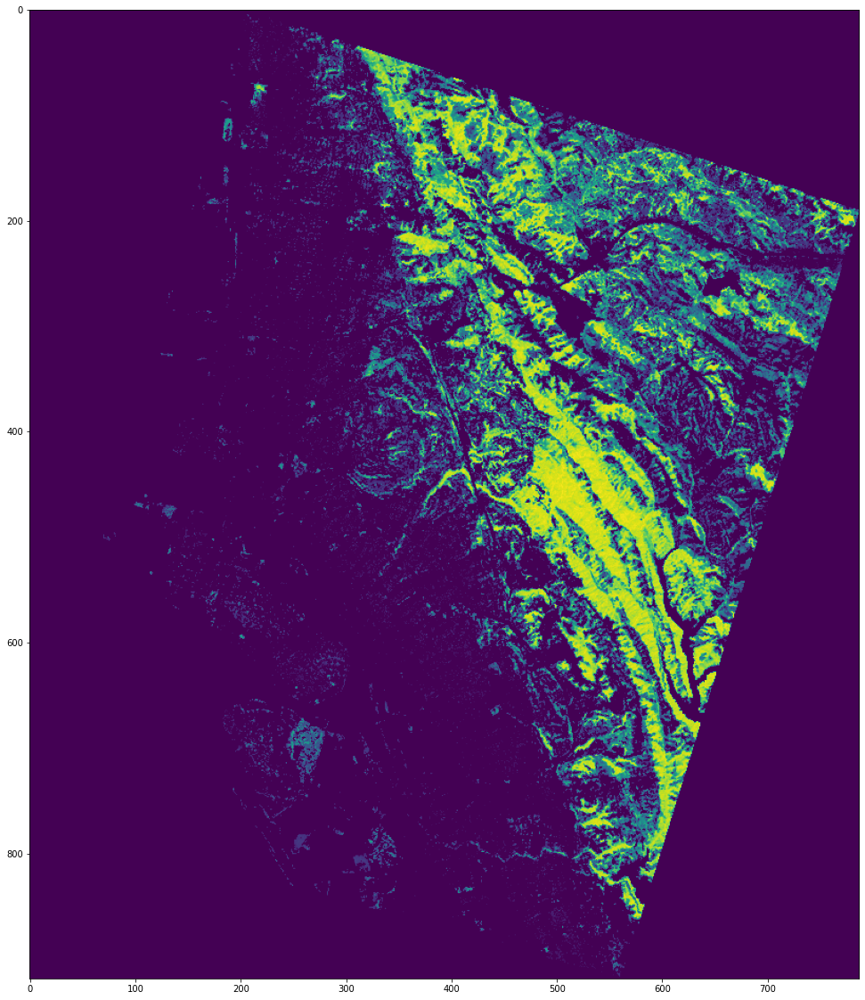

In [7]:
import rasterio
src = rasterio.open("CA_trees2016/2016_tree_canopy_OAK.tif")
plt.imshow(src.read(1))
plt.show()

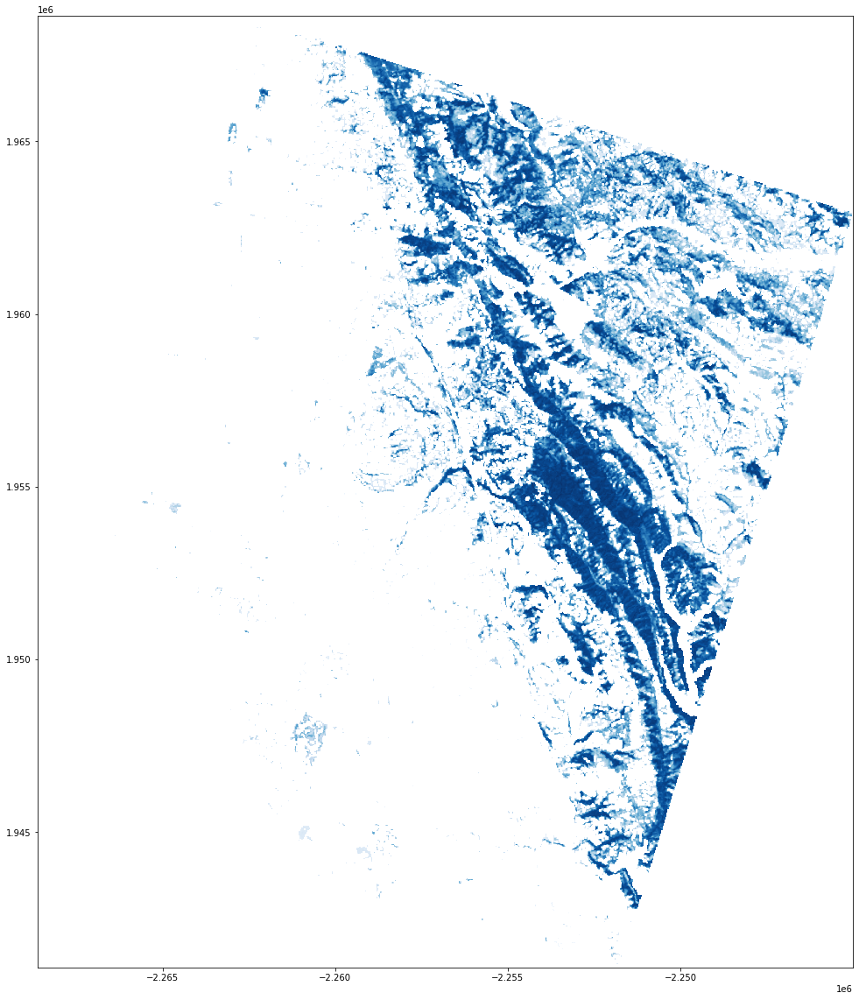

In [8]:
# from rasterio.plot import show
# base = sf_county_3.plot(figsize=(15, 15), color='black')
# sf.plot(ax =base, column = 'holc_grade', cmap = holc_cmap, legend = True, figsize=[18, 10])
# plt.title('San Francisco HOLC Grades')
# plt.show()

show(src, cmap='Blues')
plt.show()

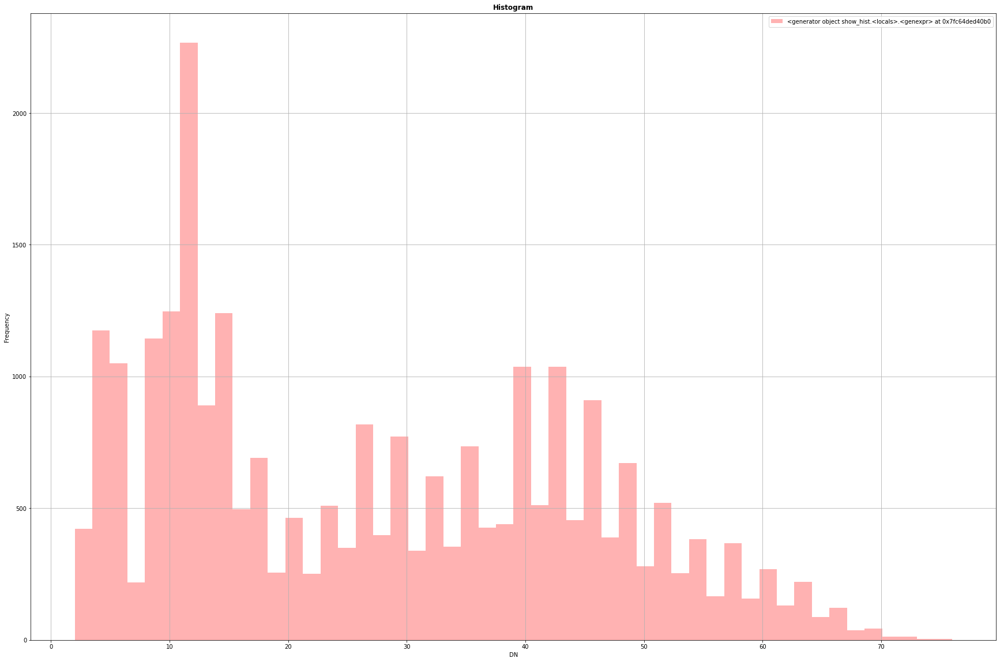

In [14]:
from rasterio.plot import show_hist
show_hist(src, bins=50, lw=0.0, stacked=False, alpha=0.3, histtype='stepfilled', title="Histogram")

<AxesSubplot:>

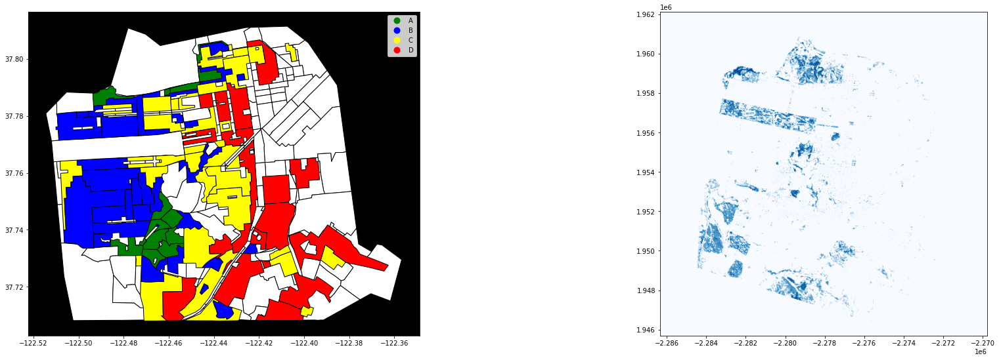

In [10]:
fig = plt.figure()

ax1=plt.subplot(2, 2, 1)
ax1.set_facecolor('black')

ax2=plt.subplot(2, 2, 2)
ax2.set_facecolor('white')

base = sf_county_3.plot(ax = ax1,figsize=(15, 15), color='white')
sf.plot(ax =ax1, column = 'holc_grade', cmap = holc_cmap, legend = True, figsize=[18, 10])
show((src, 1), cmap='Blues', ax=ax2)
# show(src, ax=base, cmap='Blues')


Reference code: 
https://github.com/mapbox/rasterio/blob/fb93a6425c17f25141ad308cee7263d0c491a0a9/examples/rasterio_polygonize.py

In [57]:
# import rasterio
from rasterio.features import shapes
mask = None
# with rasterio.drivers():
with rasterio.open("CA_trees2016/2016_tree_canopy_SF.tif") as src:
    image = src.read(1) # first band
    results = (
    {'properties': {'raster_val': v}, 'geometry': s}
    for i, (s, v) 
    in enumerate(
        shapes(image, mask=mask, transform=src.transform)))

In [30]:
import geopandas as gpd

In [58]:
geoms = list(results)
# first feature
gpd_polygonized_raster  = gpd.GeoDataFrame.from_features(geoms)
print(geoms[0])
# gpd_polygonized_raster

{'properties': {'raster_val': 17.0}, 'geometry': {'type': 'Polygon', 'coordinates': [[(-2279355.0, 1960845.0), (-2279355.0, 1960785.0), (-2279325.0, 1960785.0), (-2279325.0, 1960845.0), (-2279355.0, 1960845.0)]]}}


,geometry,raster_val
0,"POLYGON ((-2279355.000 1960845.000, -2279355.0...",17.0
1,"POLYGON ((-2279325.000 1960845.000, -2279325.0...",28.0
2,"POLYGON ((-2279295.000 1960845.000, -2279295.0...",15.0
3,"POLYGON ((-2279265.000 1960845.000, -2279265.0...",14.0
4,"POLYGON ((-2279295.000 1960815.000, -2279295.0...",14.0
5,"POLYGON ((-2279325.000 1960815.000, -2279325.0...",0.0
6,"POLYGON ((-2279355.000 1960785.000, -2279355.0...",15.0
7,"POLYGON ((-2279295.000 1960785.000, -2279295.0...",12.0
8,"POLYGON ((-2279385.000 1960755.000, -2279385.0...",21.0
9,"POLYGON ((-2279355.000 1960755.000, -2279355.0...",24.0


<AxesSubplot:>

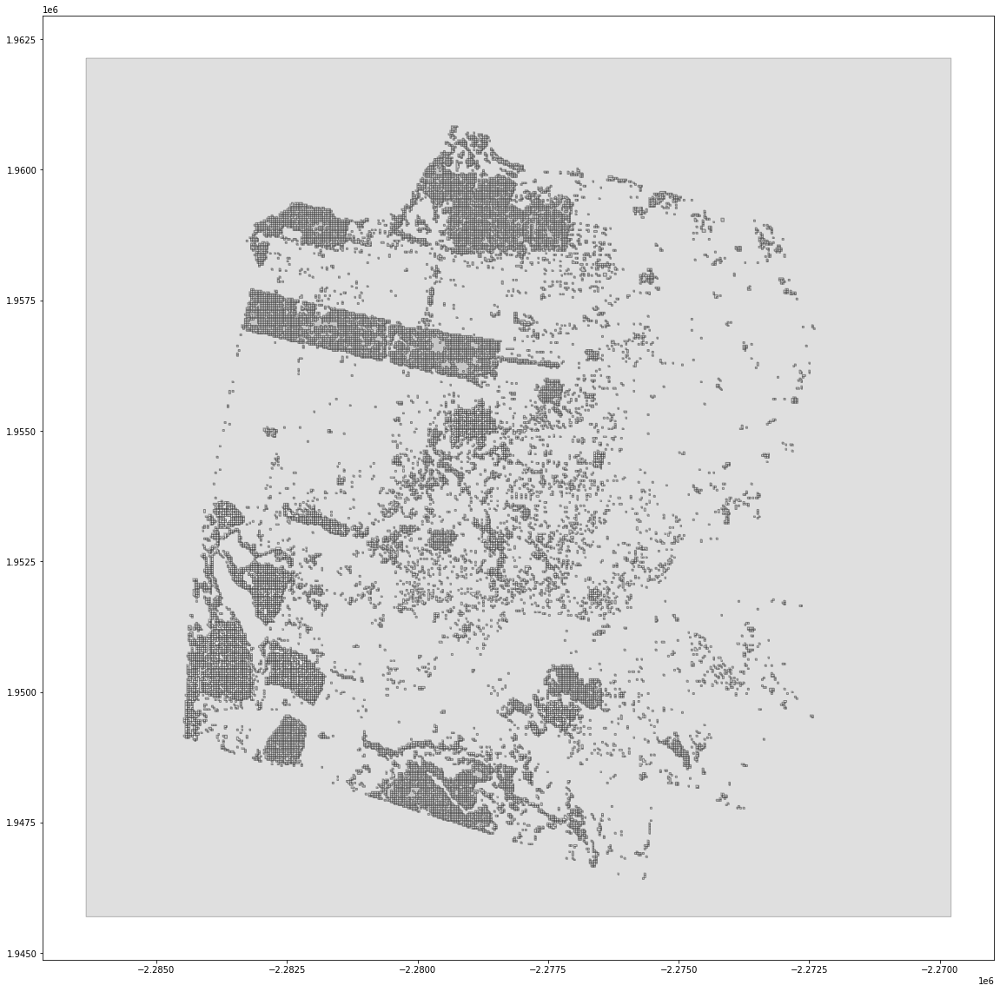

In [34]:
gpd_polygonized_raster.plot(facecolor='grey', alpha=0.25)

# 2279355.000

In [59]:
rotated = gpd_polygonized_raster['geometry'].rotate(10)
copied_gpd = gpd_polygonized_raster.copy()
copied_gpd['geometry'] = rotated

# rotated
copied_gpd.head()#.plot(facecolor='grey', alpha=0.25)

,geometry,raster_val
0,"POLYGON ((-2279359.982 1960841.940, -2279349.5...",17.0
1,"POLYGON ((-2279327.377 1960842.167, -2279322.1...",28.0
2,"POLYGON ((-2279297.377 1960842.167, -2279292.1...",15.0
3,"POLYGON ((-2279267.377 1960842.167, -2279262.1...",14.0
4,"POLYGON ((-2279297.377 1960812.167, -2279292.1...",14.0


<AxesSubplot:>

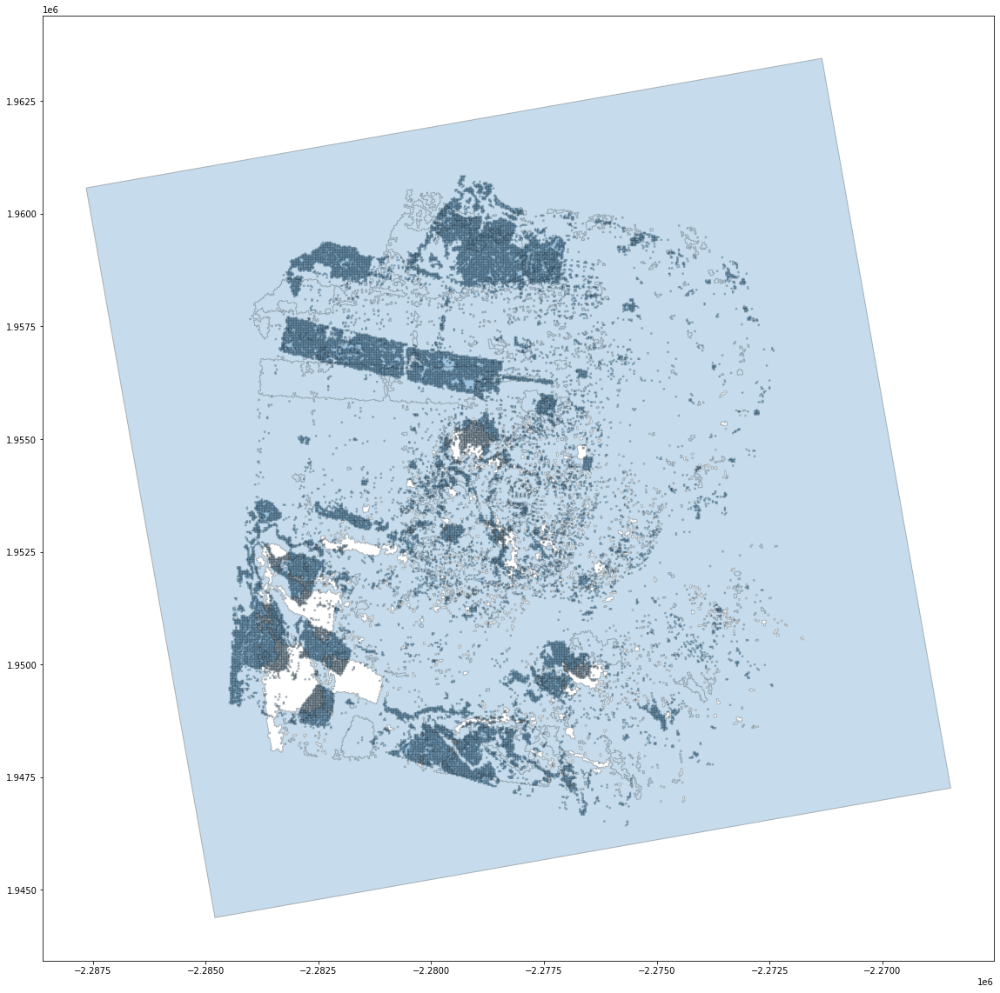

In [61]:
copied_gpd.plot(alpha=0.25)

<AxesSubplot:>

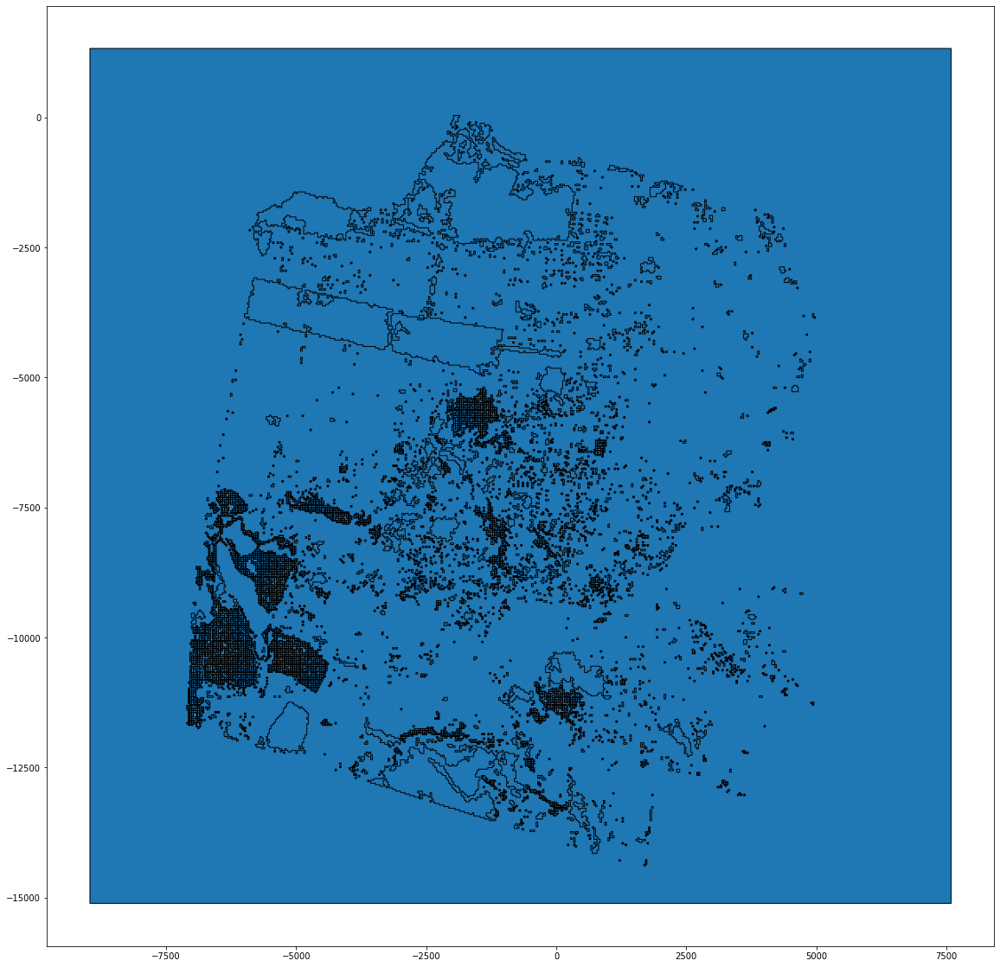

In [89]:
# scale_sf = 
gpd_polygonized_raster['geometry'].translate(xoff=2277378.0, yoff=-x, zoff=0.0).plot()
# transform_sf.plot()

In [ ]:
.scale(xfact=0.05, yfact=0.05, zfact=0.0).

In [76]:
# from shapely.geometry import Point
# -2279355 1960845
-2277500 + 122

-2277378

In [73]:
1960845 - 35

1960810

In [ ]:
2,280,000

In [ ]:
10K across